In [1]:
## Importing Libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv3D, MaxPooling3D, UpSampling3D, concatenate, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split
import albumentations as A
from skimage import io
from patchify import patchify, unpatchify
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras import backend as K
import segmentation_models_3D as sm
import keras

2024-07-26 12:02:35.296127: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-26 12:02:35.319943: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-26 12:02:35.333001: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-26 12:02:35.333027: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-26 12:02:35.349450: I tensorflow/core/platform/cpu_feature_gua

Segmentation Models: using `keras` framework.


In [2]:
tf.config.list_physical_devices('GPU')
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


2024-07-26 12:02:37.886486: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:37.935908: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:37.935950: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
2024-07-26 12:02:37.940255: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without N

True

In [3]:
from mpl_toolkits import mplot3d
from matplotlib import pyplot
import os


path_steel_stl= '../steel/stl'
paths = [os.path.join(path_steel_stl, folder) for folder in os.listdir(path_steel_stl)]
folders = [folder for folder in paths if os.path.isdir(folder)]

In [4]:
def readImages(folder, n_patch = 64, step = 64):
    file_combined = os.path.join(folder,'output_combined_matriz_fibras.tif')
    file_fibras = os.path.join(folder,'output_fibras.tif')

    image = io.imread(file_combined)
    mask = io.imread(file_fibras)
    image_patches = patchify(image, (n_patch, n_patch, n_patch), step=step)
    mask_patches = patchify(mask, (n_patch, n_patch, n_patch), step=step)
    return image, mask, image_patches, mask_patches

In [5]:
def preprocess(images, masks):
    images = np.stack((images,)*3, axis=-1)
    masks = np.expand_dims(masks, axis=4)
    images = images / 255.0
    masks = masks / 255.0
    return images, masks

In [6]:
def calculate_metrics(y_true, y_pred):
    smooth = 1e-5  # Adiciona suavização para evitar divisão por zero

    # Converte y_true para valores binários (0 e 1)
    y_true = K.cast(y_true > 0, dtype='float32')

    # Converte y_true para valores binários (0 e 1)
    y_pred = K.cast(y_pred > 0, dtype='float32')

    # Calcula soma de y_true e soma de y_pred
    sum_true = K.sum(y_true)
    sum_pred = K.sum(y_pred)

    
    # Flatten tensors
    flat_y_true = K.flatten(y_true)
    flat_y_pred = K.flatten(y_pred)

    # Calculate intersection and union
    intersection = K.sum(flat_y_true * flat_y_pred)
    union = K.sum(flat_y_true) + K.sum(flat_y_pred) - intersection

    # Calcula coeficiente Dice
    dice = (2. * intersection + smooth) / (sum_true + sum_pred + smooth)
    # Calculate IoU score
    iou_score = intersection / union
    
    return dice, iou_score

In [7]:
def predict_patches(image_patches, model):
    predicted_patches = []
    for i in range(image_patches.shape[0]):
      for j in range(image_patches.shape[1]):
        for k in range(image_patches.shape[2]):
          single_patch = image_patches[i,j,k, :,:,:]
          single_patch_3ch = np.stack((single_patch,)*3, axis=-1)
          single_patch_3ch_input =  np.expand_dims(single_patch_3ch, 0)
          single_patch_prediction = model.predict(single_patch_3ch_input, verbose=0)
          single_patch_prediction_squeeze = np.squeeze(single_patch_prediction, axis=0)
          predicted_patches.append(single_patch_prediction_squeeze)
    predicted_patches = np.array(predicted_patches)
    predicted_patches_reshaped = np.reshape(predicted_patches,
                                        (image_patches.shape[0], image_patches.shape[1], image_patches.shape[2],
                                         image_patches.shape[3], image_patches.shape[4], image_patches.shape[5]) )
    predicted_patches_uint8 = (predicted_patches_reshaped > 0.5).astype(np.uint8)
    
    return predicted_patches_uint8

In [8]:
trained_models_path = 'trained_models'

model_files = [file for file in os.listdir(trained_models_path) if file.startswith("best")]
print(model_files)

['best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras', 'best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras', 'best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras', 'best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras', 'best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras', 'best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras']


In [9]:
from tensorflow.keras.models import load_model

def predictResults(mask_patches, image_patches, mask, image):
    results = {}
    model_dir = os.getcwd()
    model_dir = os.path.join(model_dir, 'trained_models')
    mask_patches = mask_patches.astype(np.uint8)
    for model_file in model_files:
        model_path = os.path.join(model_dir, model_file)
        print(f"Testing model: {model_path}")
        if model_file.endswith('.h5'):
            model = load_model(model_path, custom_objects={'dice_coef': calculate_metrics, 'iou': calculate_metrics}, compile=False)
        elif model_file.endswith('.keras'):
            model = keras.models.load_model(model_path, compile=False)
        predicted_patches = predict_patches(image_patches, model)
        
        reconstructed_image = unpatchify(predicted_patches, image.shape)
        dice_coefficient, iou = calculate_metrics(mask, reconstructed_image)
        results[model_file] = {
            'dice': dice_coefficient,
            'iou': iou,
            'predictions': reconstructed_image
        }
    return results

In [10]:
def plot_compare(image, mask, reconstructed_image):
    slice_index = reconstructed_image.shape[0] // 2  # Aqui estamos escolhendo o plano médio ao longo do eixo X
    # Plotar o slice escolhido
    plt.figure(figsize=(10, 5))
    
    # Original (Imagem de Teste)
    plt.subplot(1, 3, 1)
    plt.imshow(image[slice_index, :, :], cmap='gray')
    plt.title('Imagem de Teste')
    plt.axis('off')
    
    # Ground Truth (Máscara de Teste)
    plt.subplot(1, 3, 2)
    plt.imshow(mask[slice_index, :, :], cmap='gray')
    plt.title('Máscara de Teste (Ground Truth)')
    plt.axis('off')
    
    # Predição (Resultado da Predição)
    plt.subplot(1, 3, 3)
    plt.imshow(reconstructed_image[slice_index, :, :], cmap='gray')
    plt.title('Resultado da Predição')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [11]:
def printResults(results):
    # Ordene os resultados pelo coeficiente IoU
    sorted_results = sorted(results.items(), key=lambda item: item[1]['iou'], reverse=True)
    for model_file, metrics in sorted_results:
        print(f"Model: {model_file}")
        print(f"Dice Coefficient: {metrics['dice']}")
        print(f"IoU: {metrics['iou']}")
        reconstructed_image = metrics['predictions']
        plot_compare(image, mask, reconstructed_image)

In [12]:
amostra= '04_09'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)


../steel/stl/04_09


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras


2024-07-26 12:02:38.387246: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:38.387328: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:38.387358: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:38.387659: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-26 12:02:38.387676: I tensorflow/core/common_runtime/gpu/gpu

Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Dice Coefficient: 0.4101461172103882
IoU: 0.257

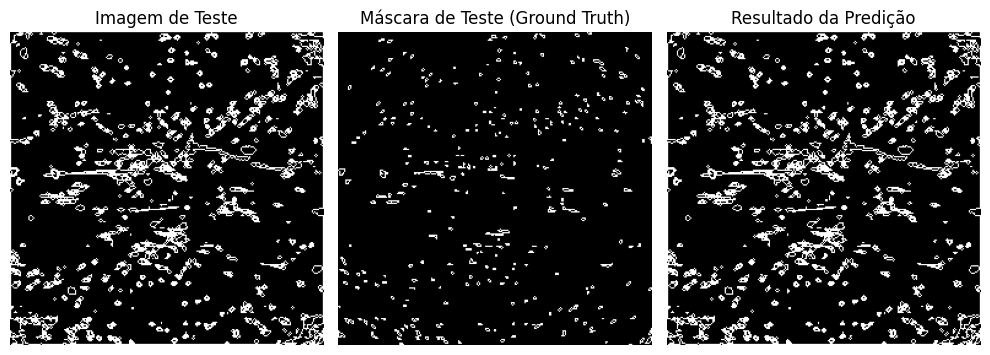

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.4101461172103882
IoU: 0.2579772472381592


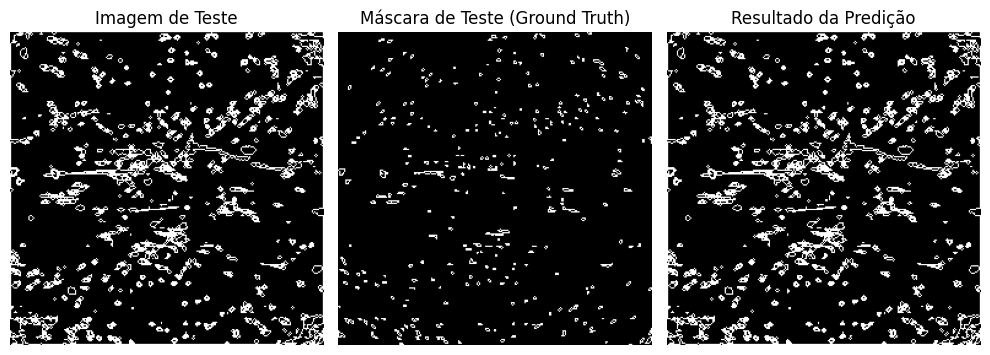

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.4101461172103882
IoU: 0.2579772472381592


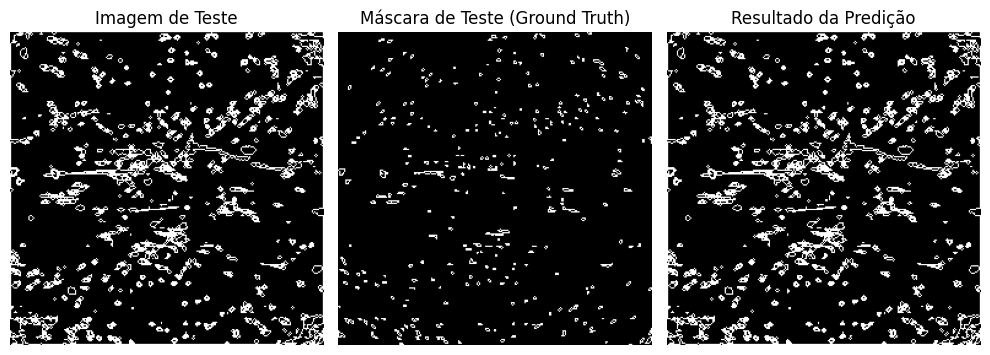

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.09103825688362122
IoU: 0.04768993332982063


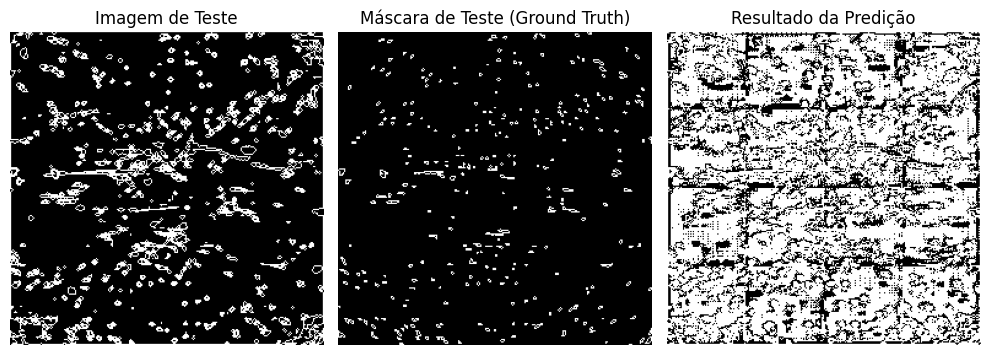

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.3840581458701706e-11
IoU: 0.0


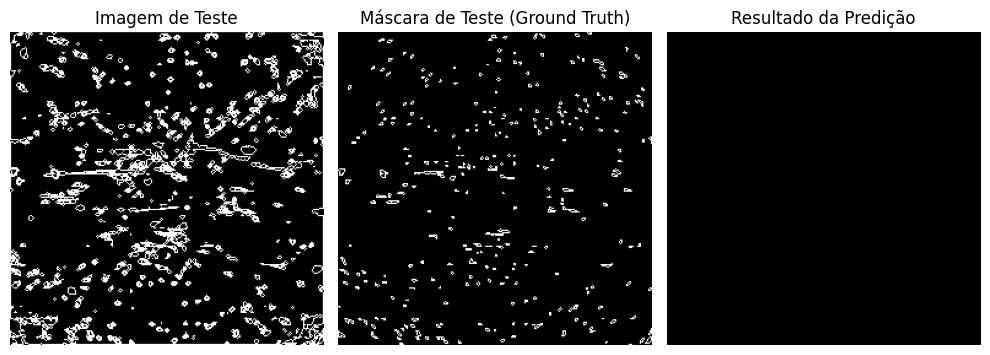

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.3840581458701706e-11
IoU: 0.0


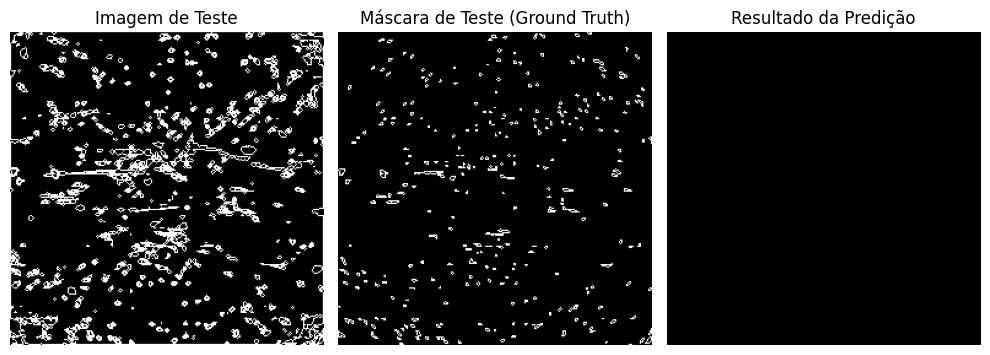

In [13]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results)

In [14]:
amostra= '03_09'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/03_09


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

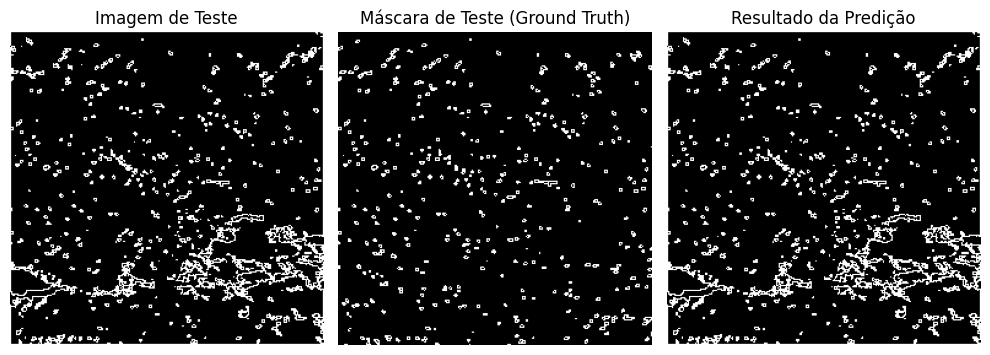

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.7405751347541809
IoU: 0.5880264043807983


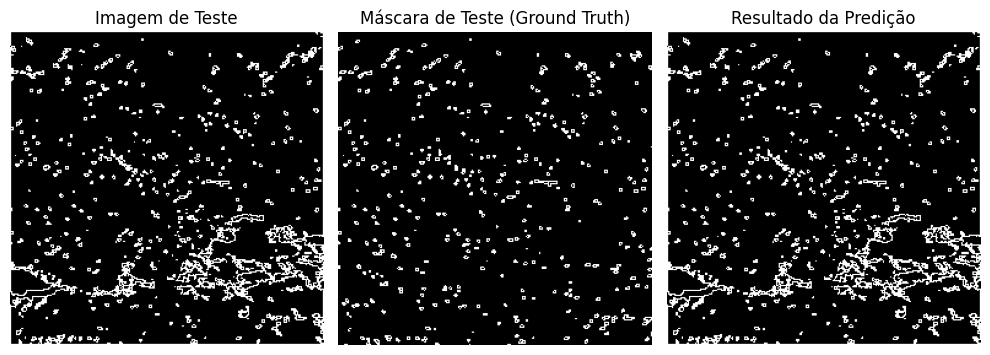

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.7405751347541809
IoU: 0.5880264043807983


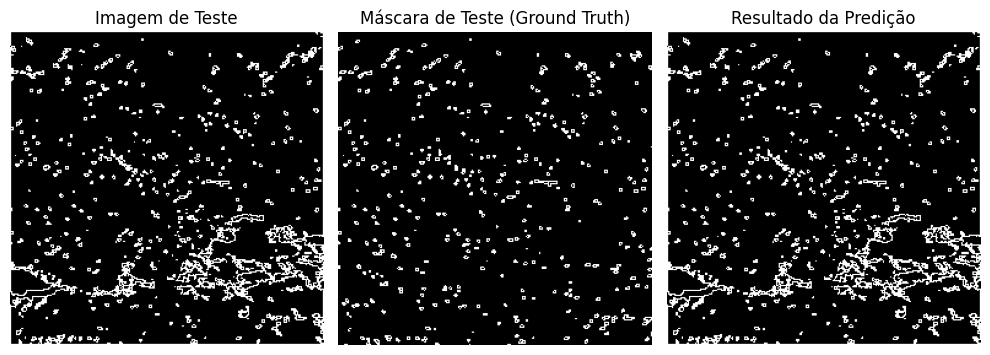

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.12332984060049057
IoU: 0.06571737676858902


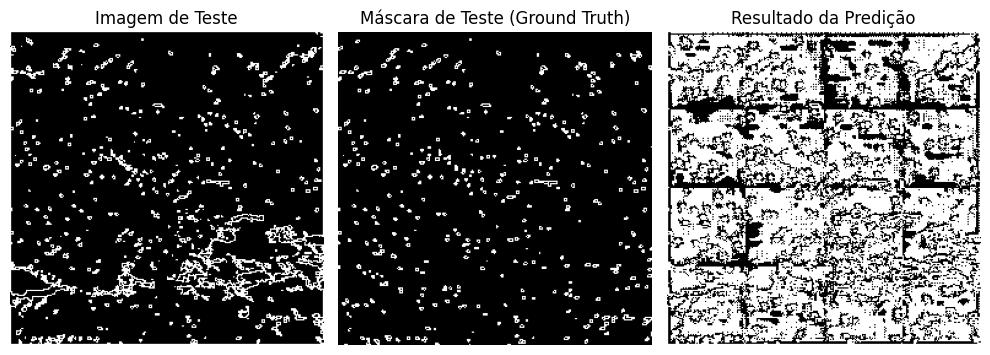

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.1252998532995662e-11
IoU: 0.0


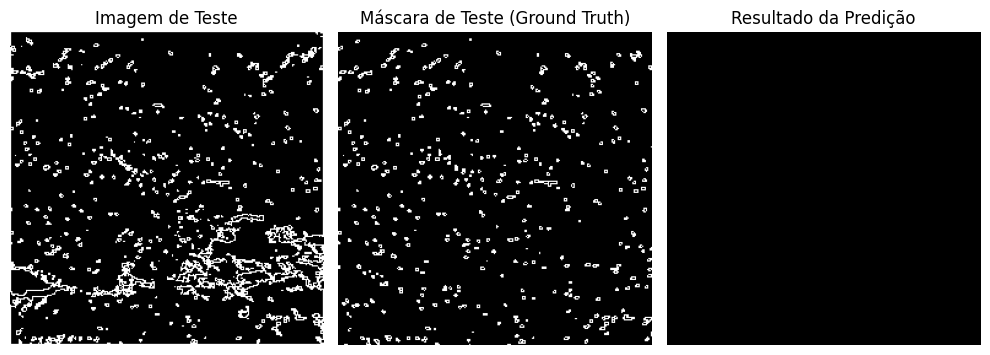

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.1252998532995662e-11
IoU: 0.0


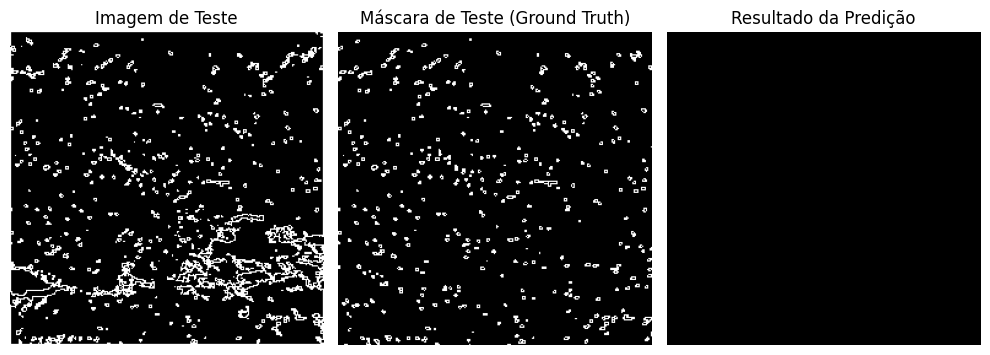

In [15]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results)    

In [16]:
amostra= '06_06'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/06_06


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

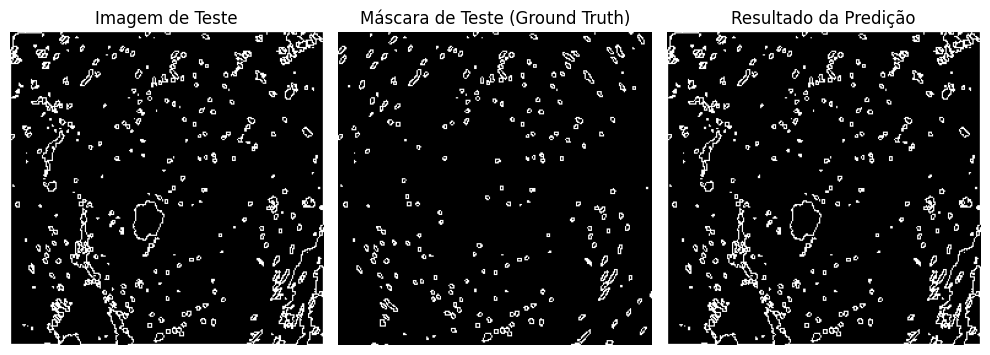

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.6807661056518555
IoU: 0.5160313844680786


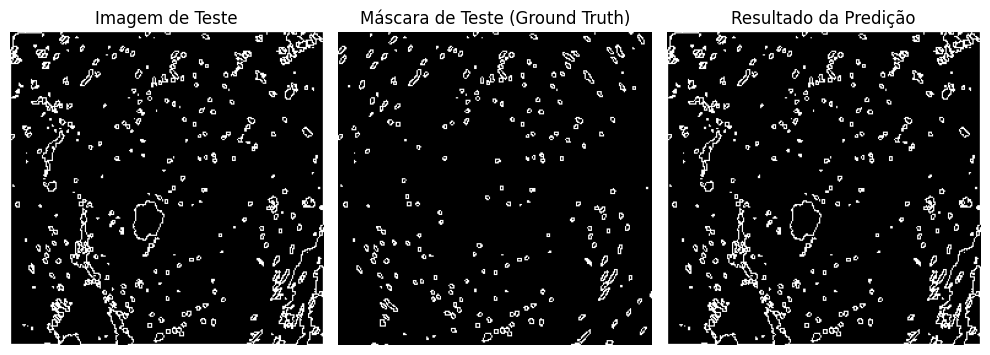

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.6807661056518555
IoU: 0.5160313844680786


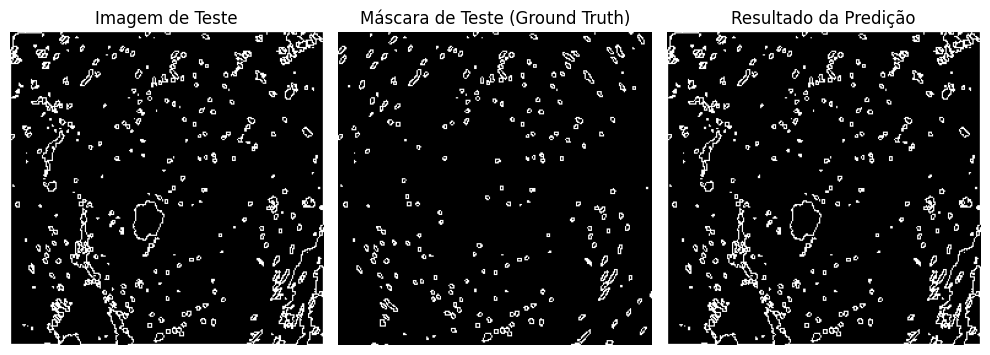

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.11551947891712189
IoU: 0.06130043789744377


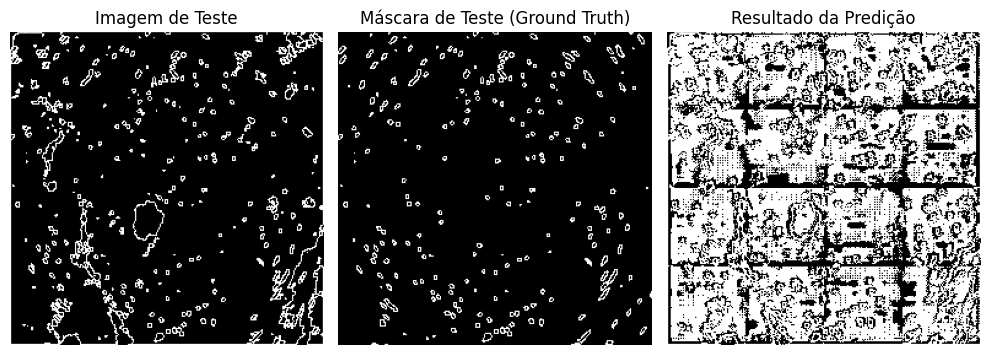

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.1908192314169508e-11
IoU: 0.0


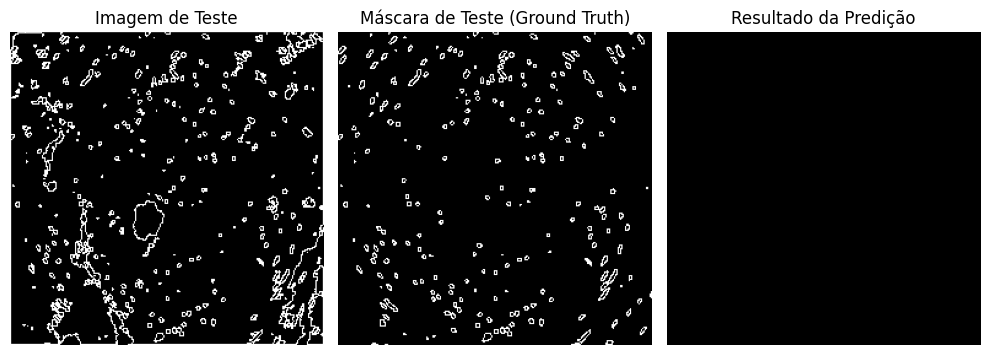

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.1908192314169508e-11
IoU: 0.0


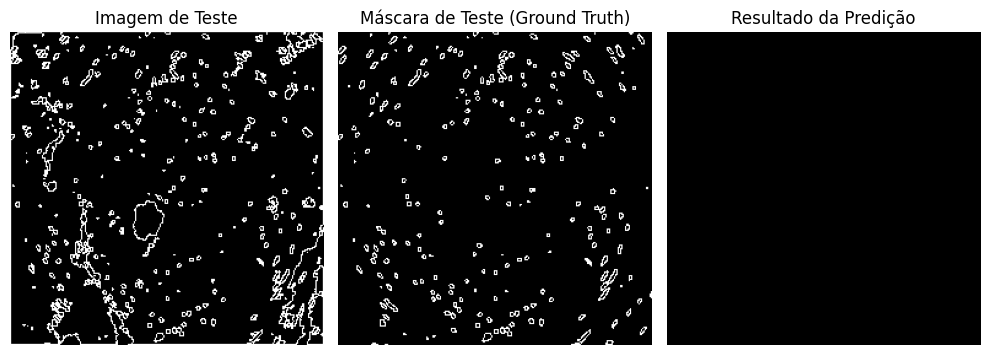

In [17]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [18]:
amostra= '07_06'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/07_06


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

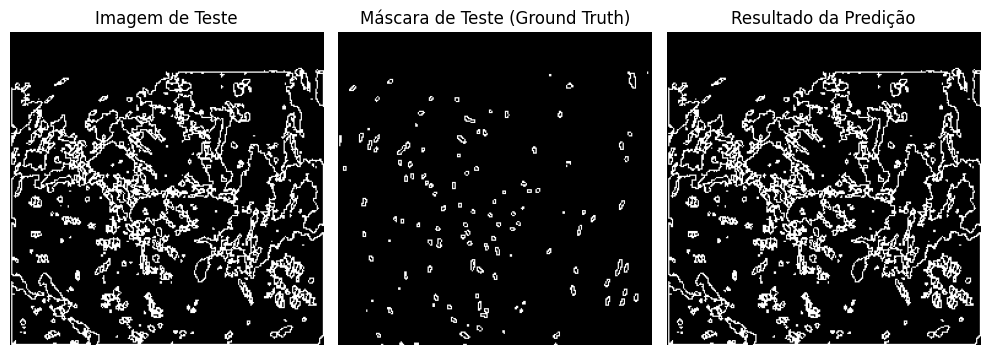

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.2958950102329254
IoU: 0.17363661527633667


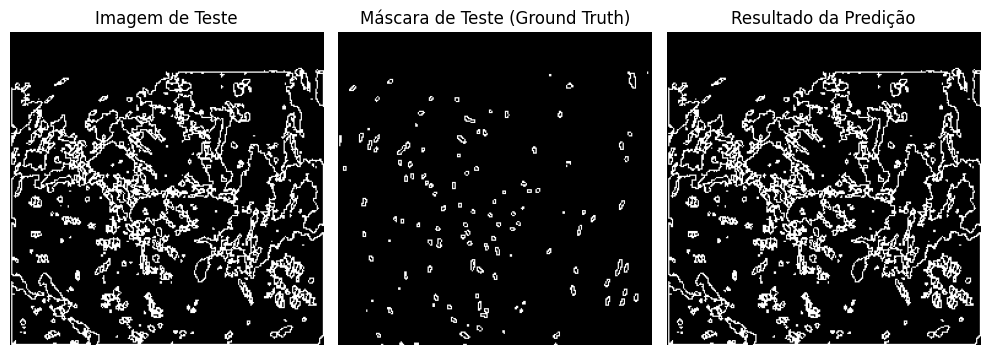

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.2958950102329254
IoU: 0.17363661527633667


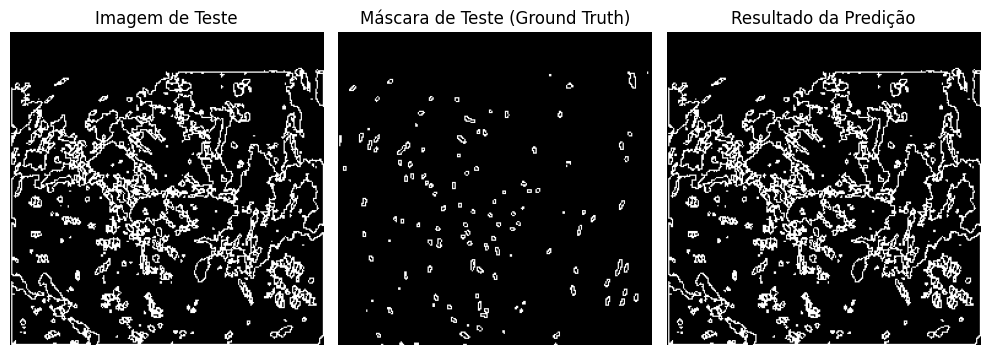

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.053876105695962906
IoU: 0.02768380008637905


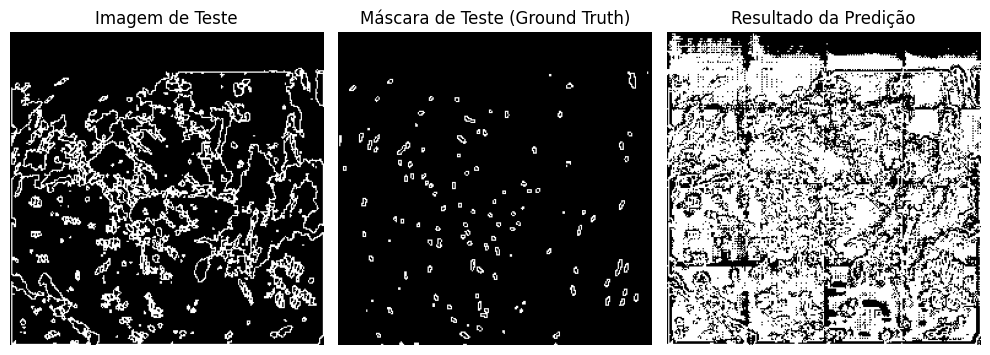

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 2.49516553252338e-11
IoU: 0.0


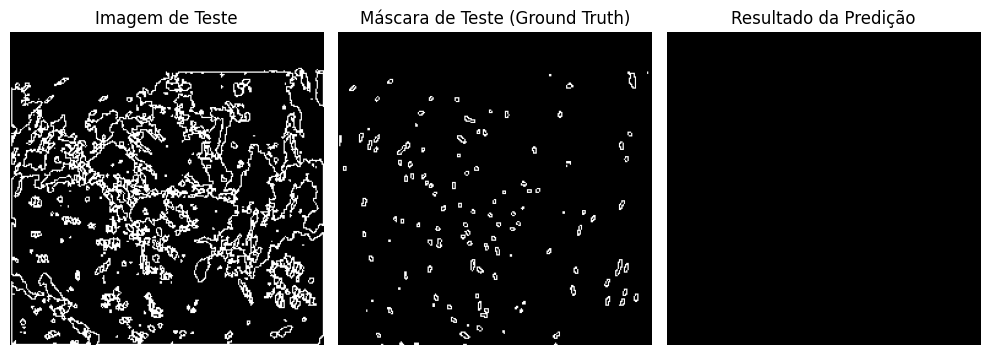

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 2.49516553252338e-11
IoU: 0.0


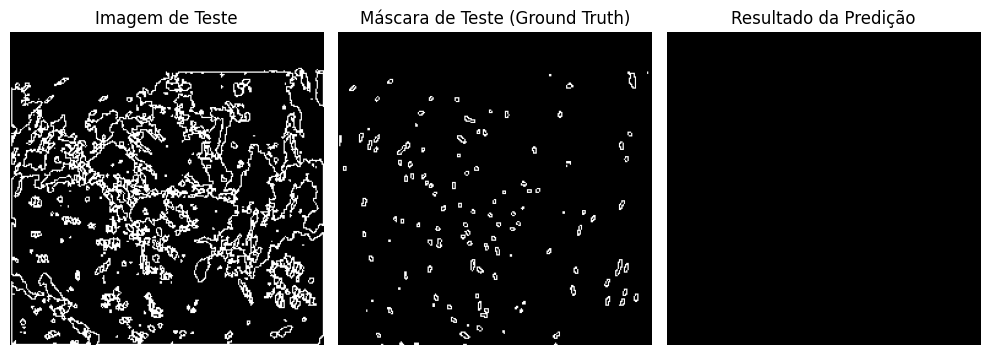

In [19]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [20]:
amostra= '07_09'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/07_09


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

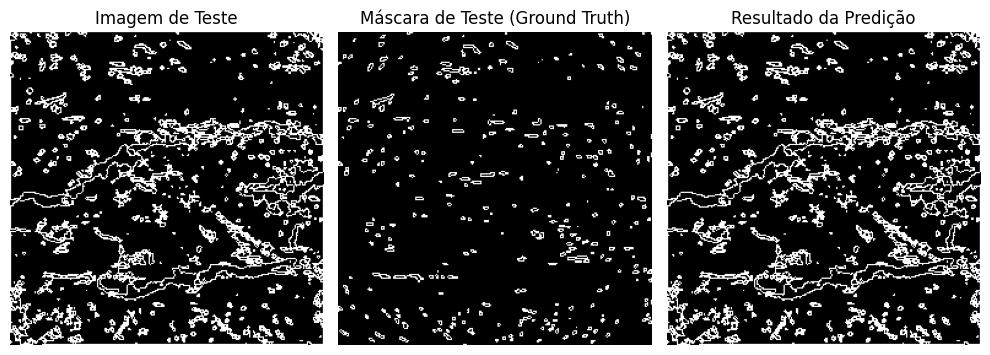

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.5374081134796143
IoU: 0.367435485124588


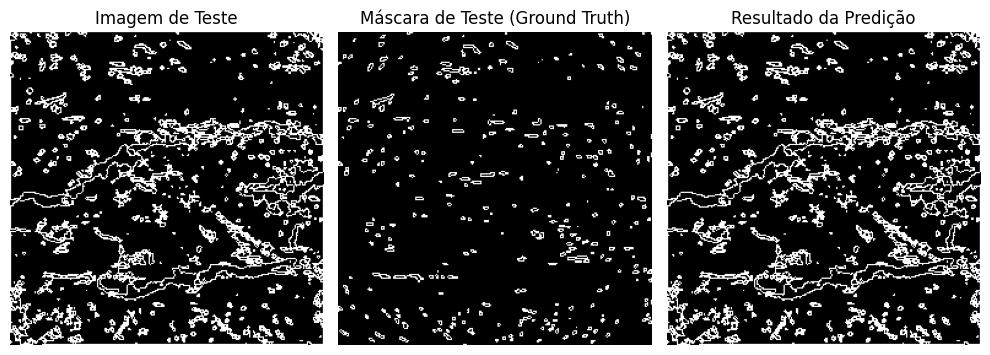

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.5374081134796143
IoU: 0.367435485124588


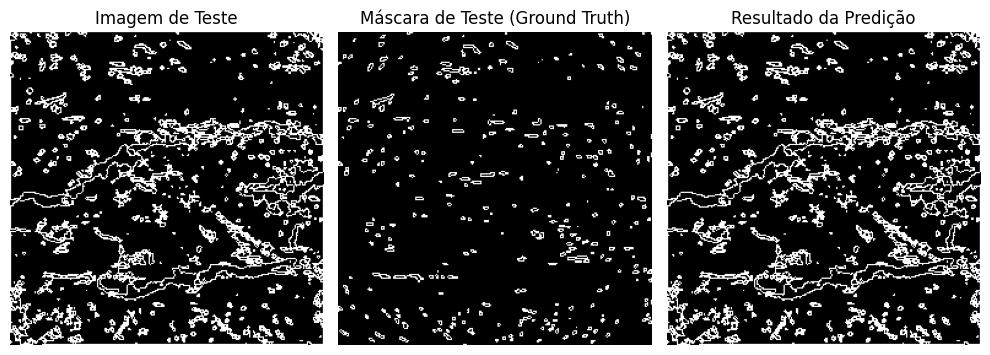

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.11053081601858139
IoU: 0.05849834159016609


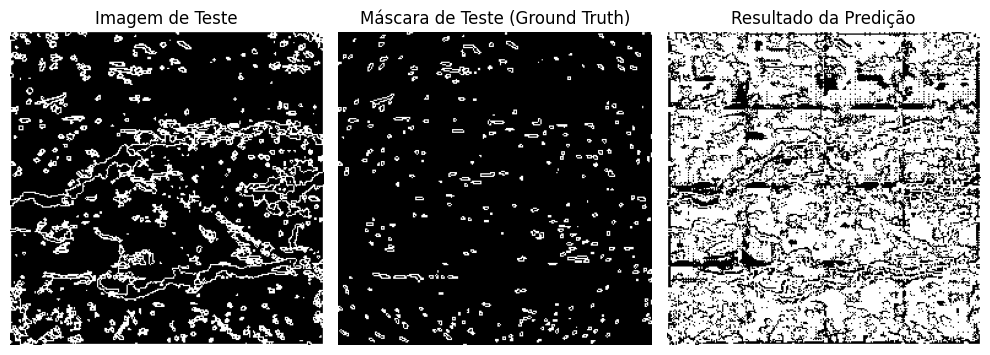

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.1832331121841566e-11
IoU: 0.0


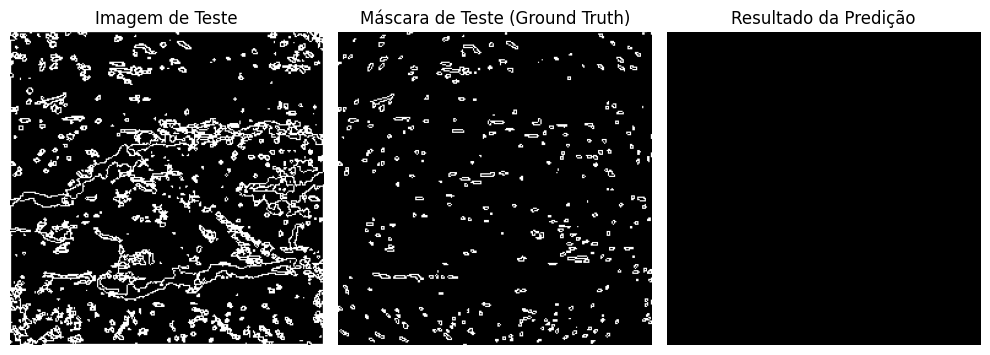

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.1832331121841566e-11
IoU: 0.0


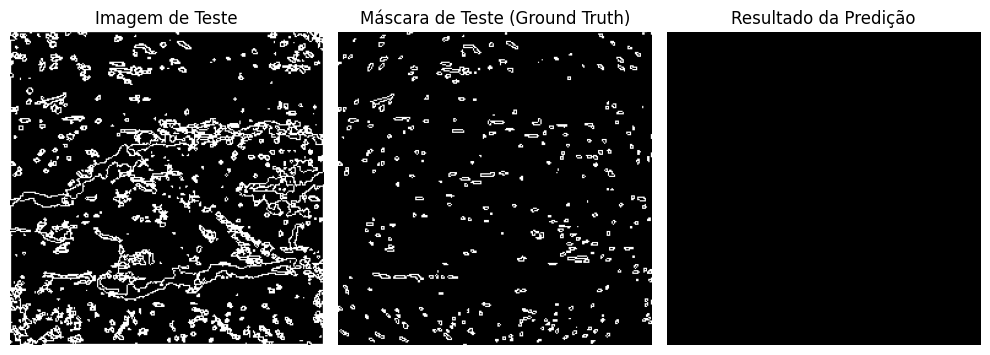

In [21]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [22]:
amostra= '09_06'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/09_06


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

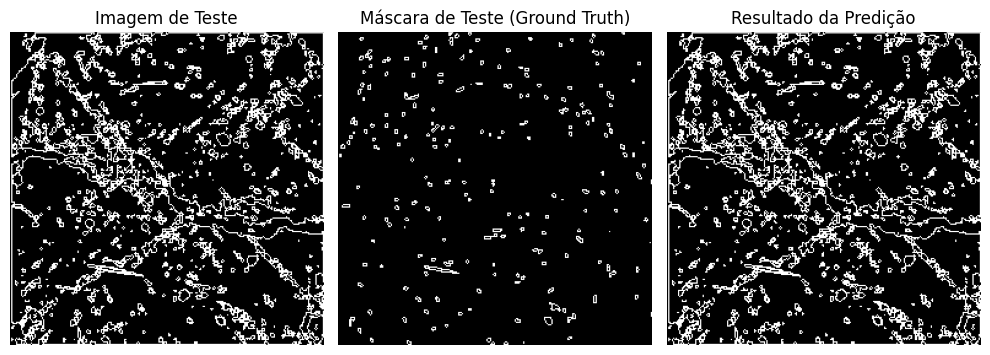

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.2866840660572052
IoU: 0.16732703149318695


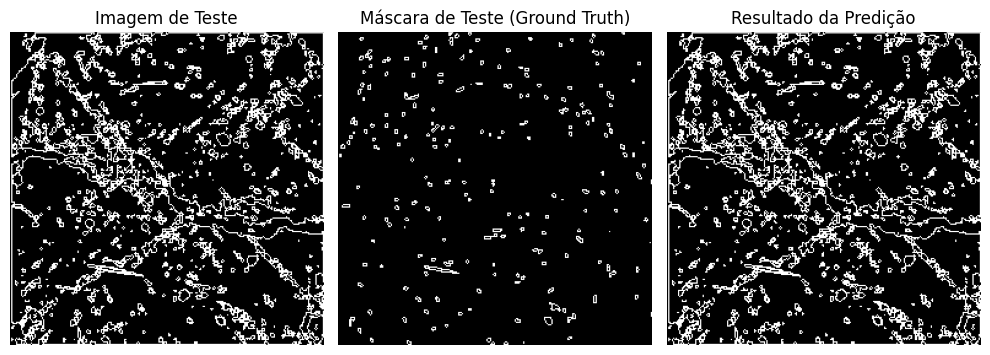

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.2866840660572052
IoU: 0.16732703149318695


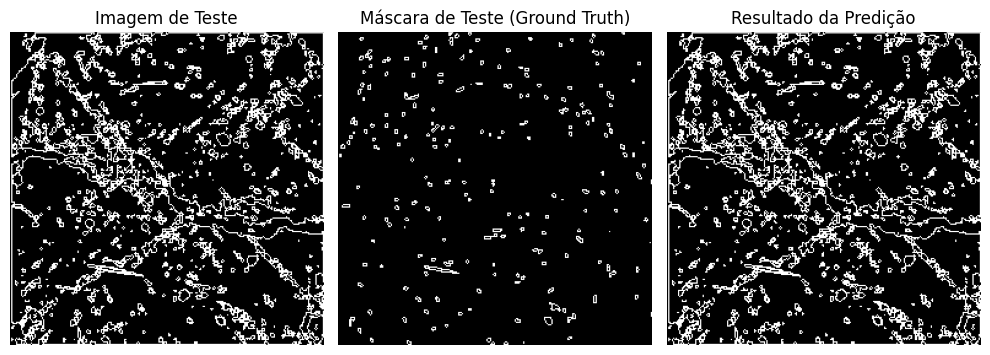

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.06557498127222061
IoU: 0.03389895334839821


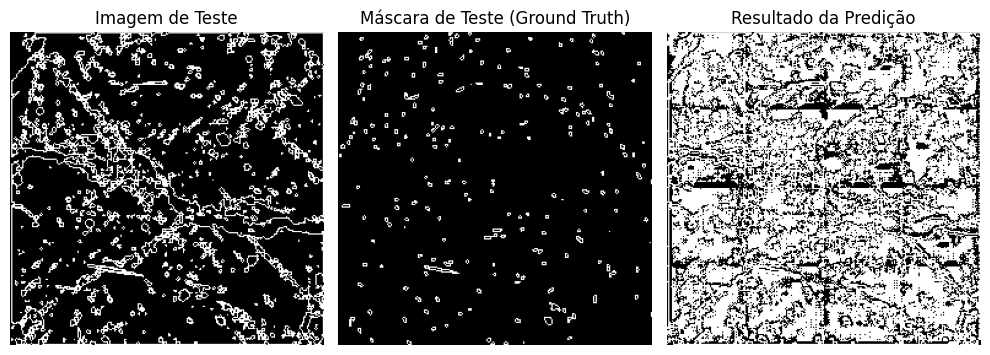

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.9434644865645723e-11
IoU: 0.0


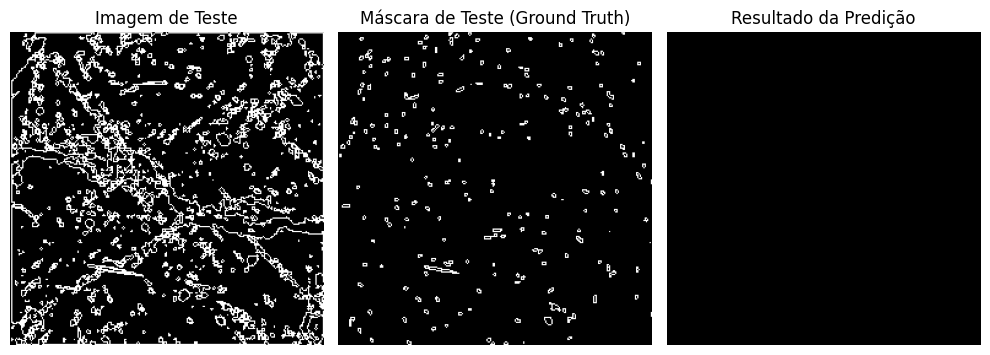

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.9434644865645723e-11
IoU: 0.0


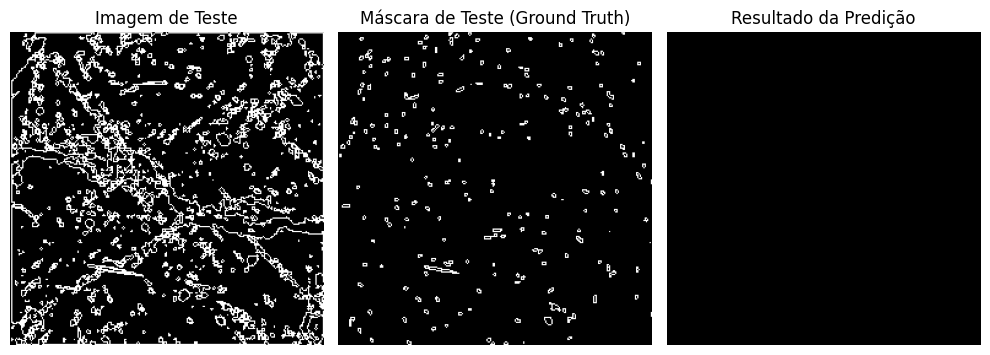

In [23]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [24]:
amostra= '11_06'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/11_06


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

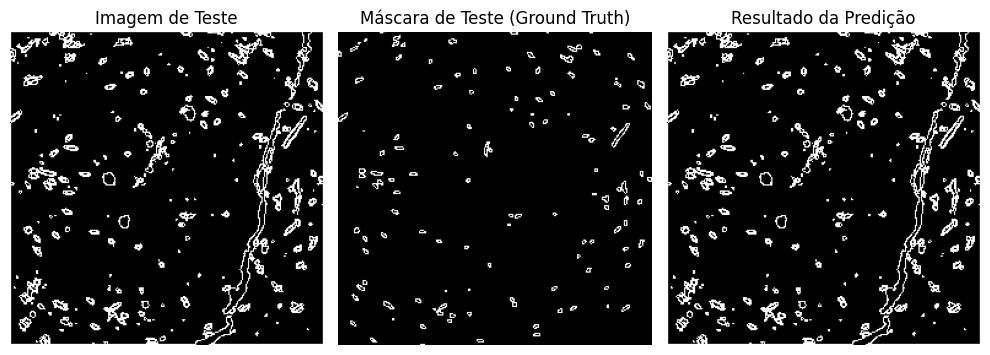

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.3930630683898926
IoU: 0.24460391700267792


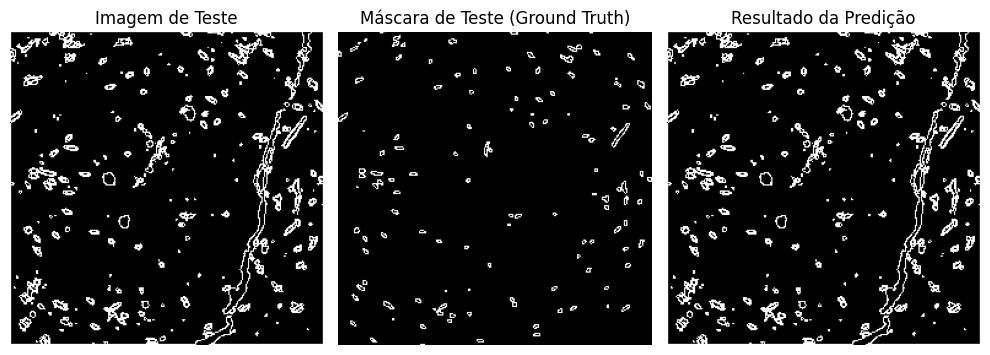

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.3930630683898926
IoU: 0.24460391700267792


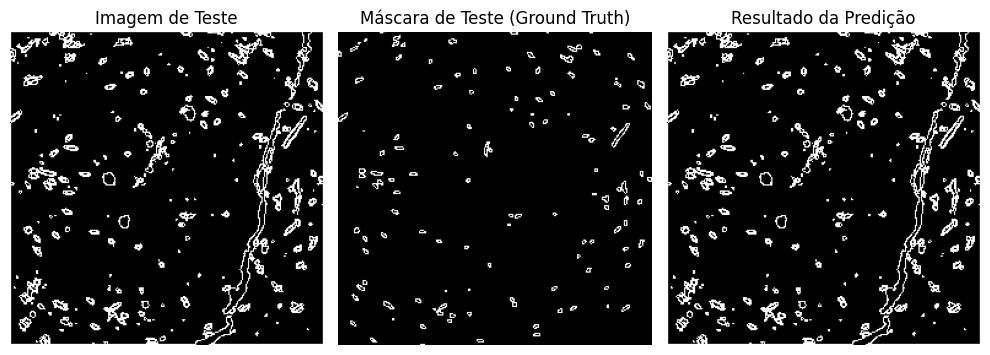

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.05945853143930435
IoU: 0.030640175566077232


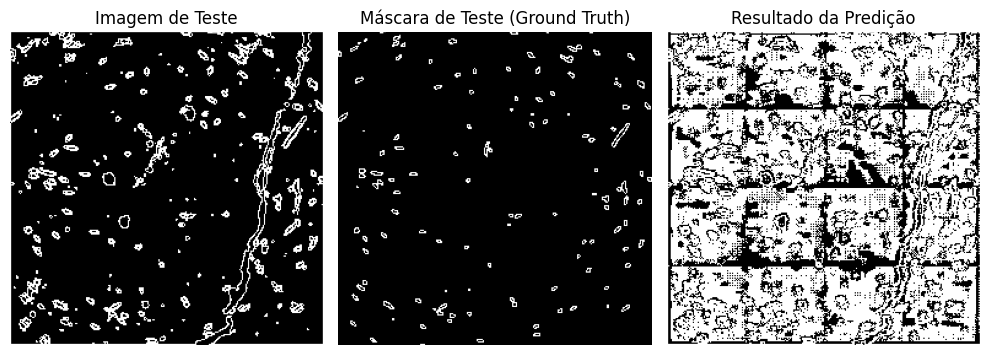

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 2.3354936040664853e-11
IoU: 0.0


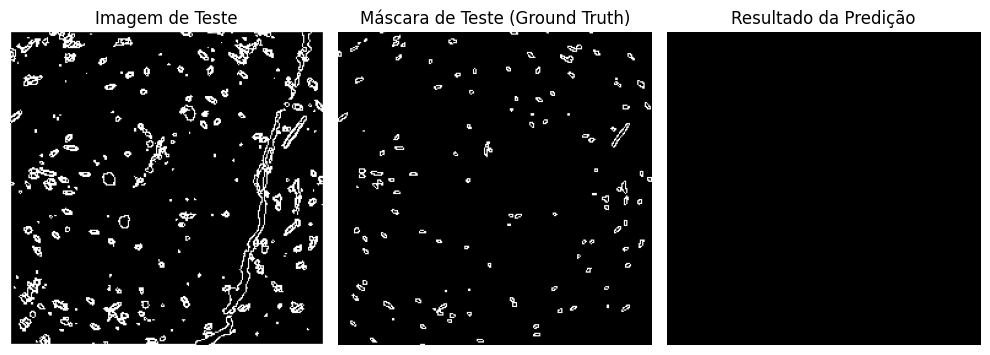

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 2.3354936040664853e-11
IoU: 0.0


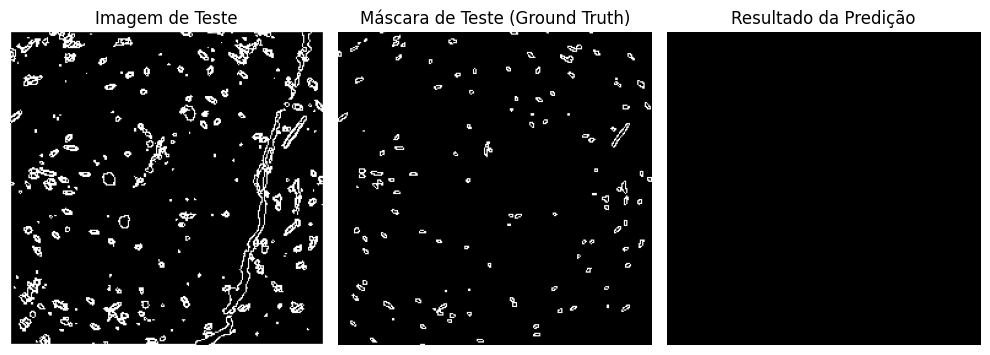

In [25]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [26]:
amostra= '22_08'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/22_08


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

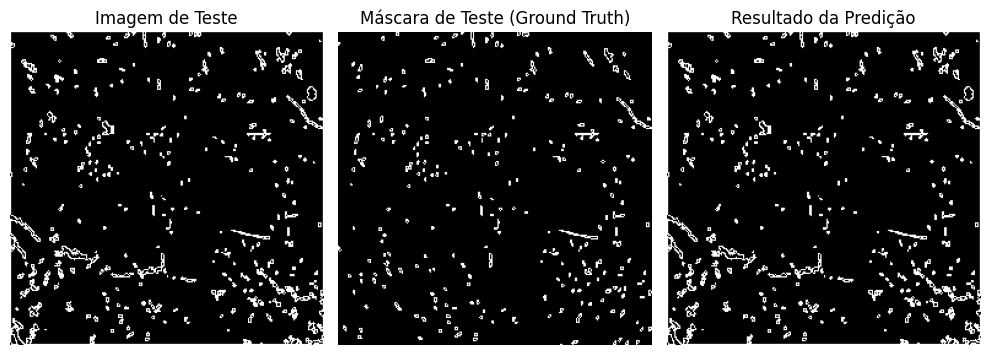

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.6293164491653442
IoU: 0.4591260254383087


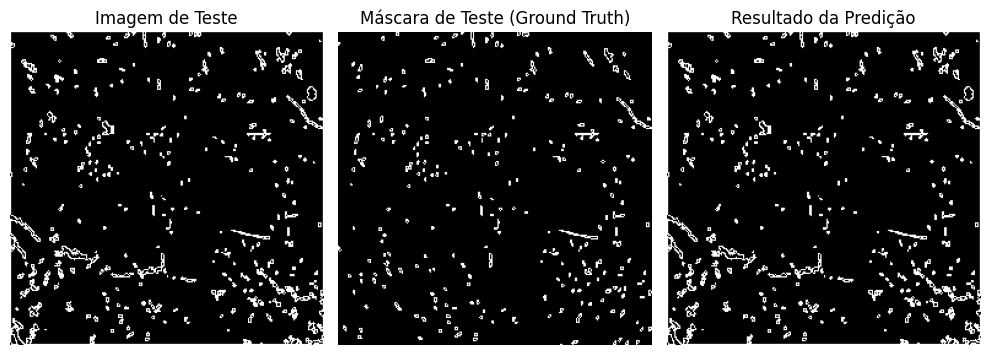

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.6293164491653442
IoU: 0.4591260254383087


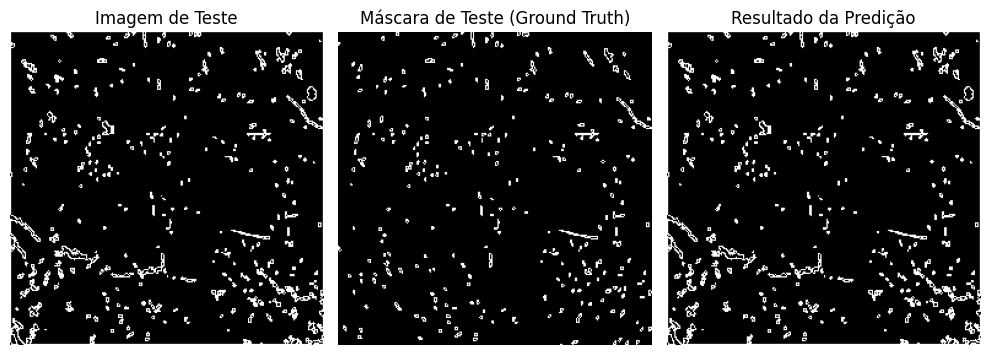

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.09402526915073395
IoU: 0.04933185502886772


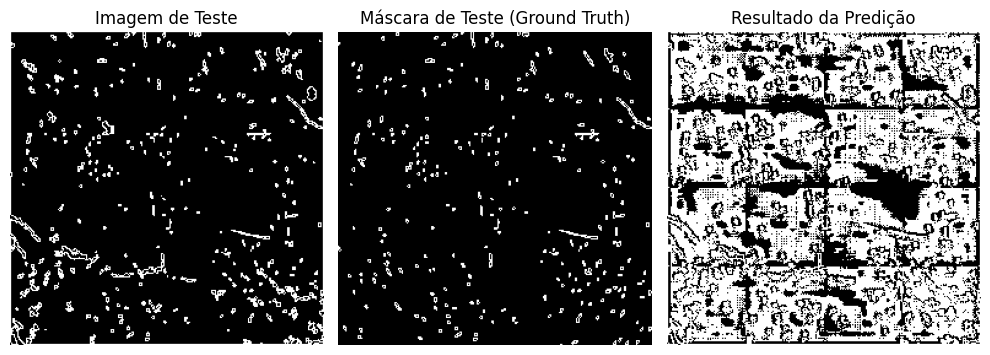

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 0.02053750678896904
IoU: 0.010375294834375381


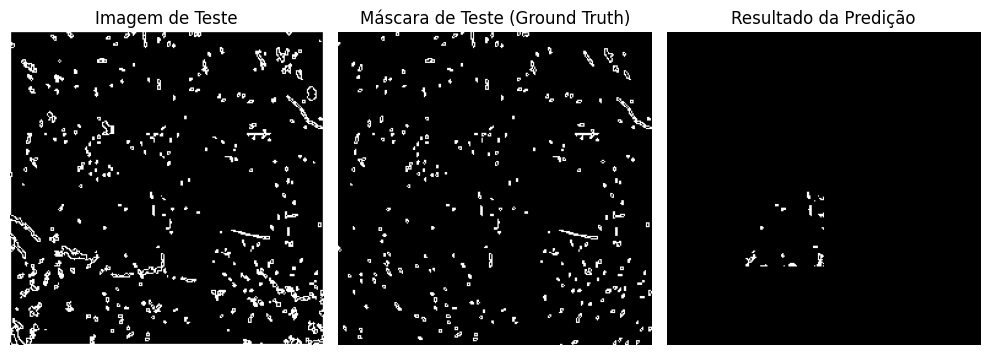

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.5780486292693574e-11
IoU: 0.0


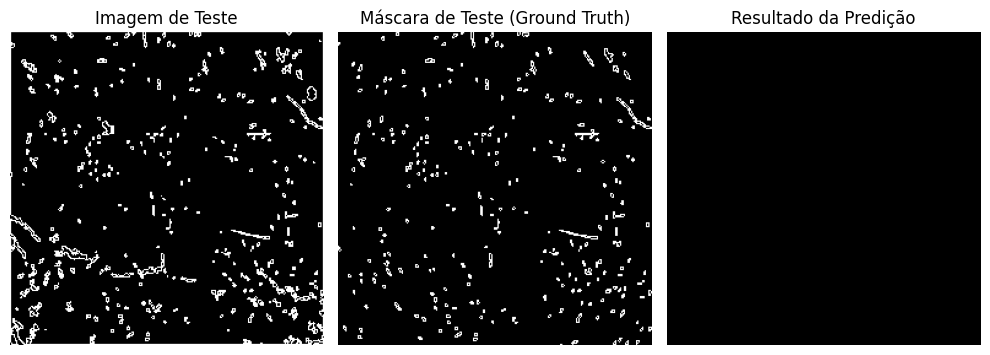

In [27]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [28]:
amostra= '23_08'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/23_08


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

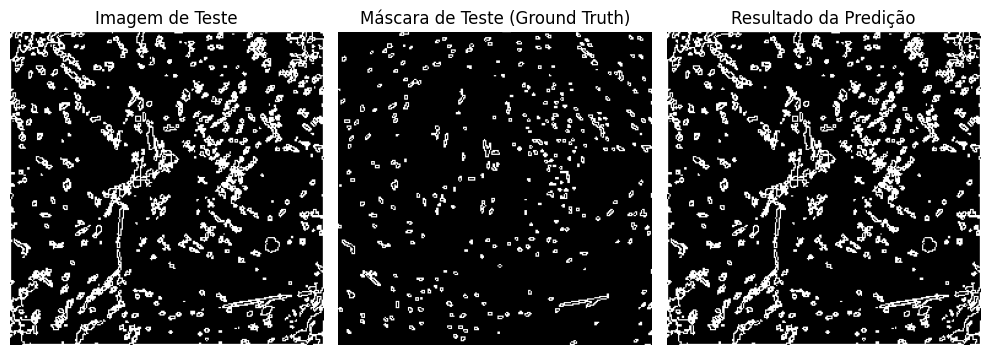

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.5145538449287415
IoU: 0.34639686346054077


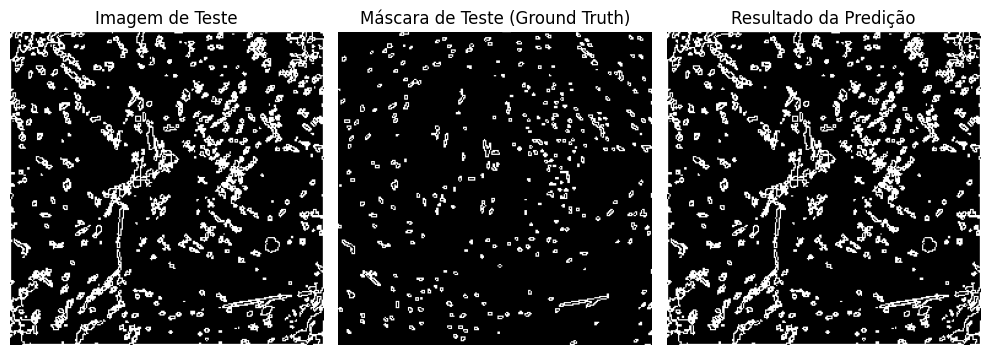

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.5145538449287415
IoU: 0.34639686346054077


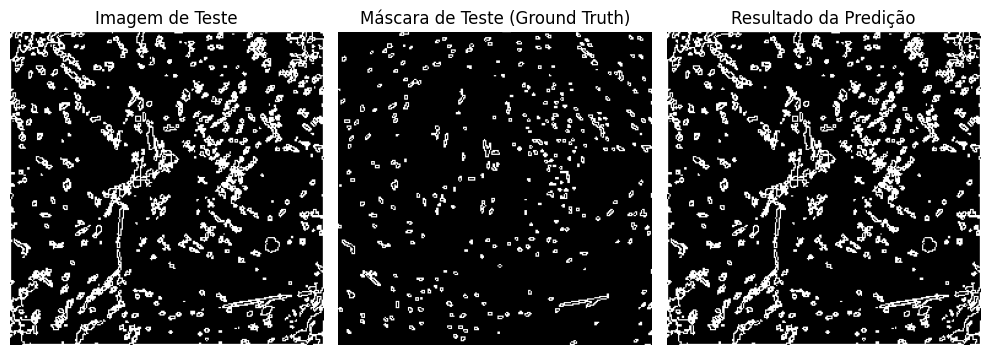

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.1257033497095108
IoU: 0.06706694513559341


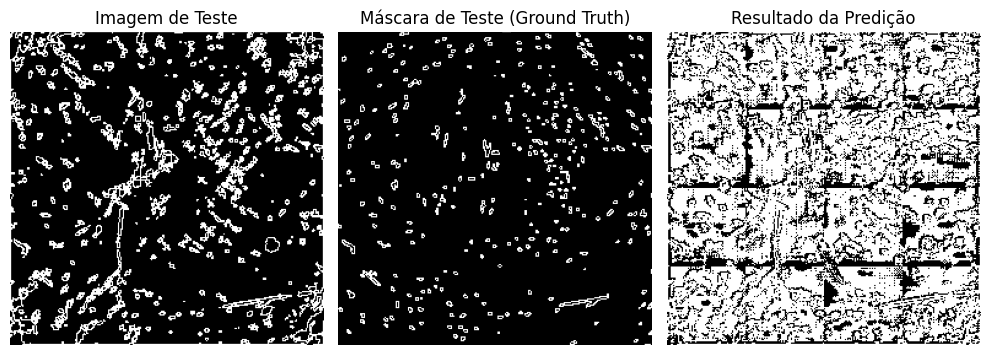

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.0145156416341283e-11
IoU: 0.0


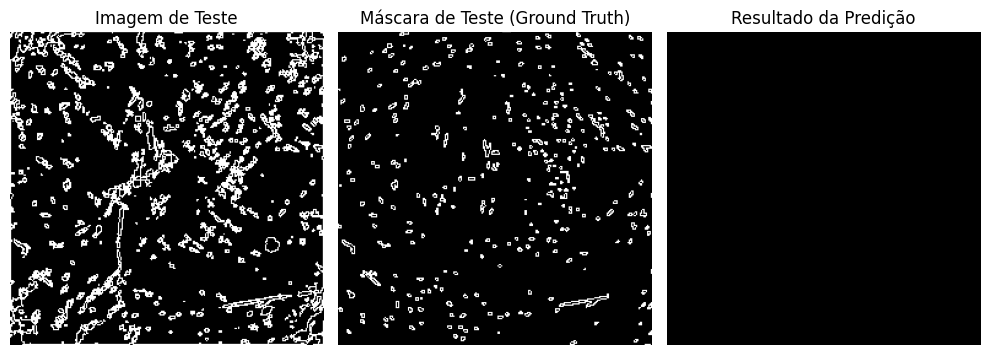

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.0145156416341283e-11
IoU: 0.0


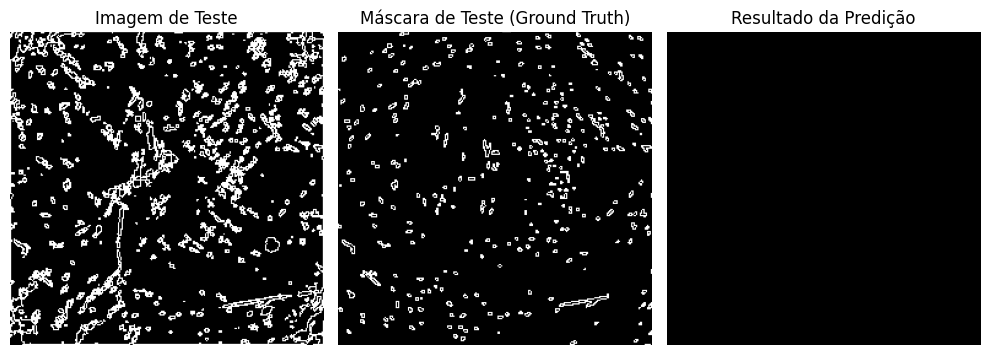

In [29]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [30]:
amostra= '28_08'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/28_08


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

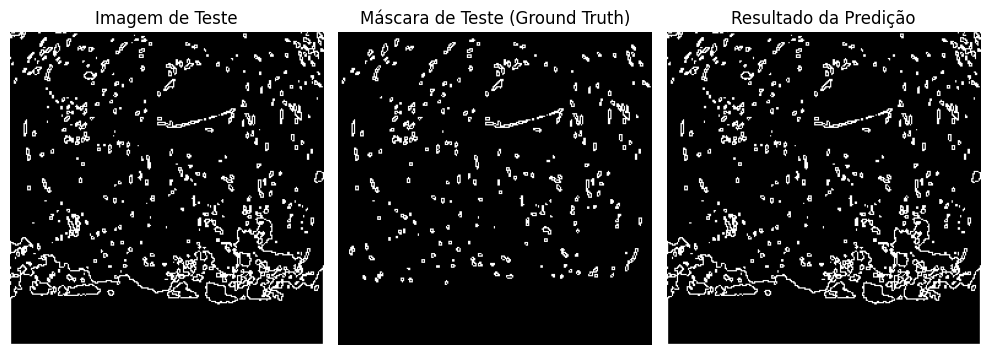

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.722510576248169
IoU: 0.5655706524848938


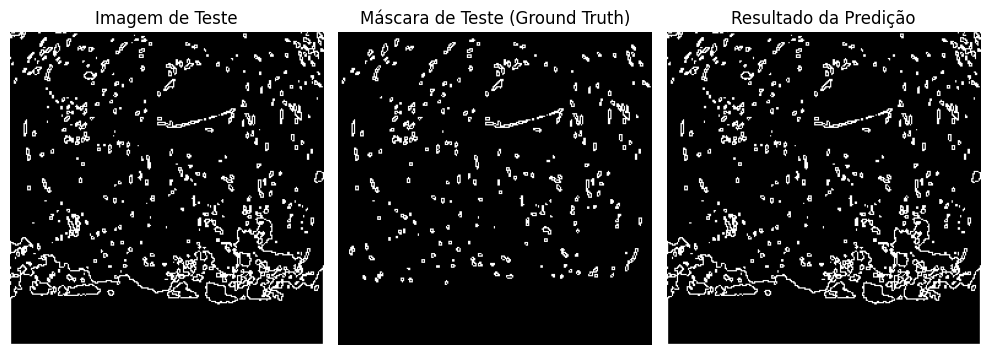

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.722510576248169
IoU: 0.5655706524848938


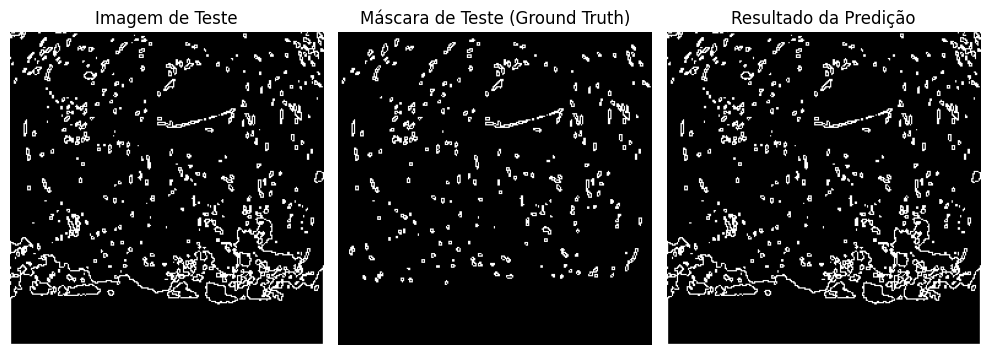

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.11058003455400467
IoU: 0.05852591618895531


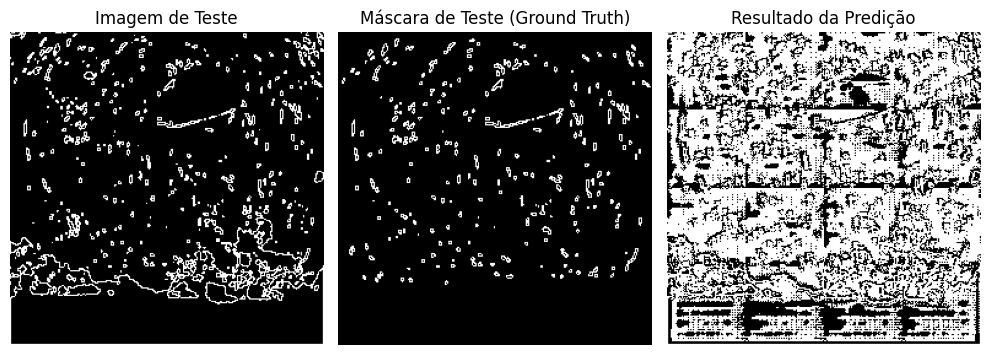

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.2523324391389146e-11
IoU: 0.0


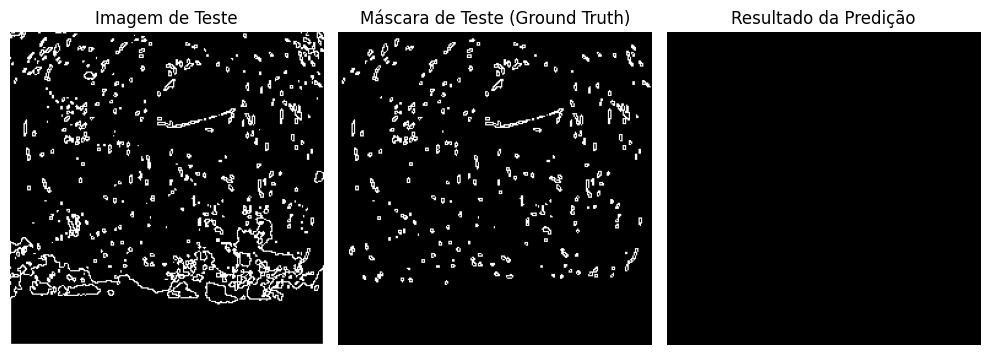

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.2523324391389146e-11
IoU: 0.0


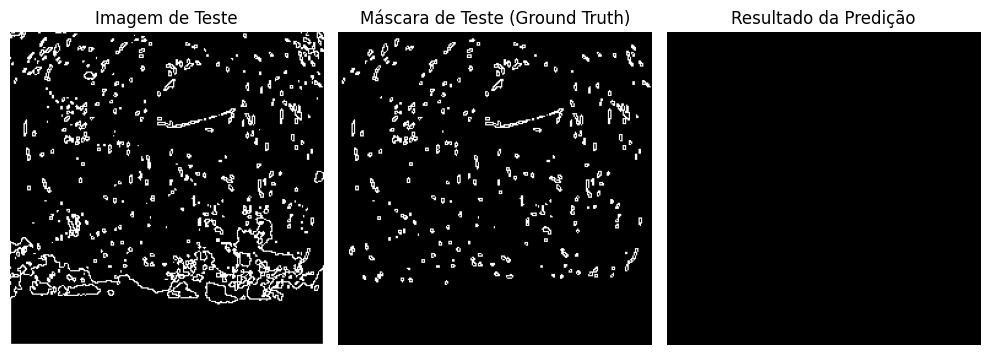

In [31]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 

In [32]:
amostra= '29_08'
folder = os.path.join(path_steel_stl, amostra)
print(folder)
image, mask, image_patches, mask_patches = readImages(folder)

../steel/stl/29_08


Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_False_GN_True_2024-07-23 19-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Testing model: /mnt/c/Users/duvrd/Desktop/Jonathan/notebooks/trained_models/best_model_Adam_loadedresnet_leftFalse_aug_True_200ep

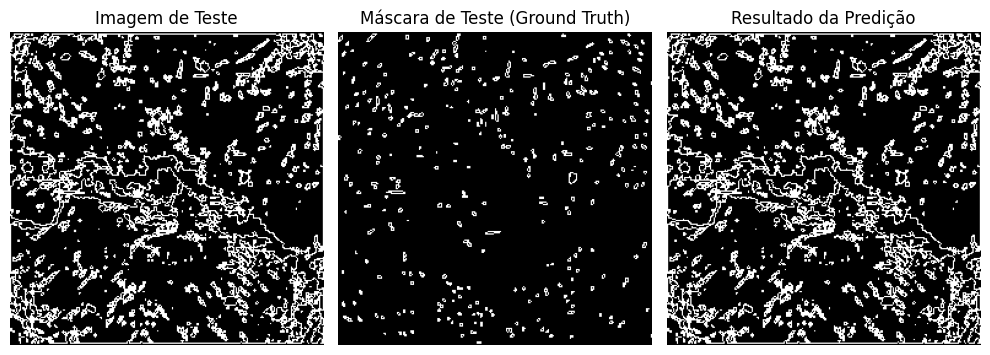

Model: best_model_Adam_loadedresnet_leftFalse_aug_False_200epochs_BN_False_GN_True_2024-07-25 09-07-25.keras
Dice Coefficient: 0.3933749198913574
IoU: 0.24484550952911377


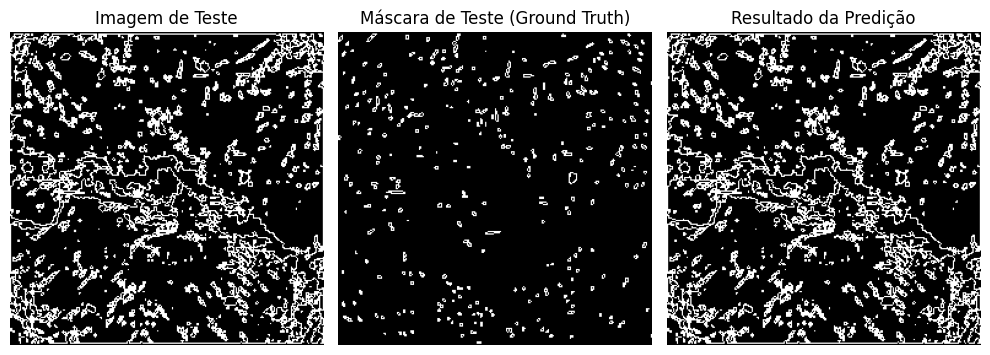

Model: best_model_Adam_loadedresnet_leftFalse_aug_True_200epochs_BN_False_GN_True_2024-07-24 15-07-24.keras
Dice Coefficient: 0.3933749198913574
IoU: 0.24484550952911377


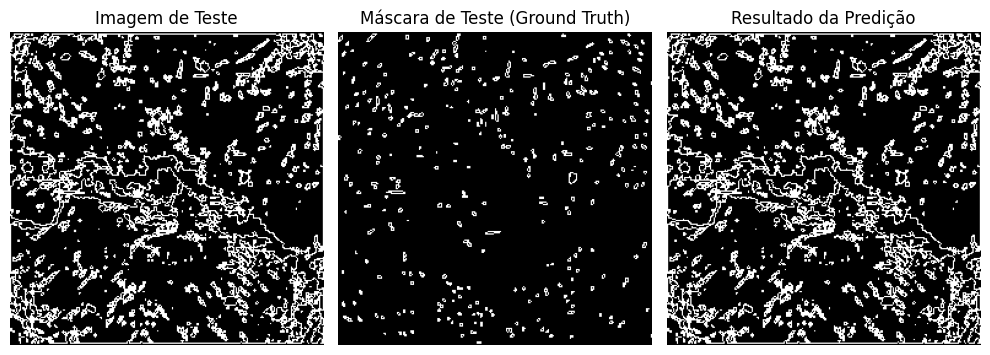

Model: best_model_Adam_loadedresnet_aug_False_200epochs_BN_True_GN_True_2024-07-23 15-07-23.keras
Dice Coefficient: 0.08980398625135422
IoU: 0.047012969851493835


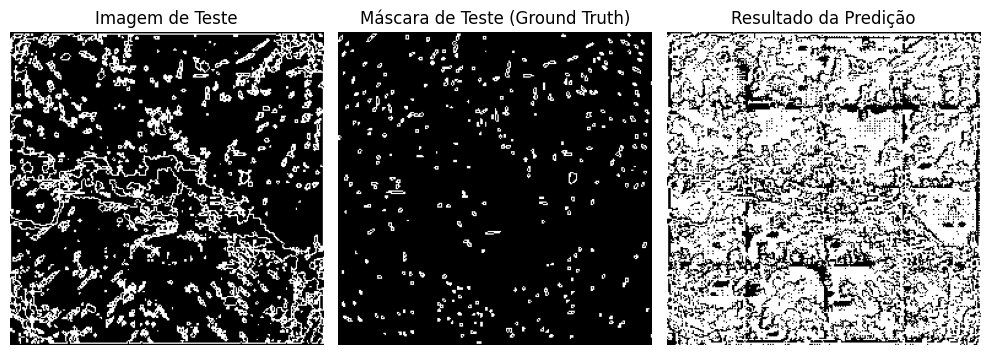

Model: best_model_Adam_loadedresnet_aug-notransp-noShiftScale-noOptDist_200epochs_BN_True_GN_True_2024-07-19 13-07-19.keras
Dice Coefficient: 1.443055570871099e-11
IoU: 0.0


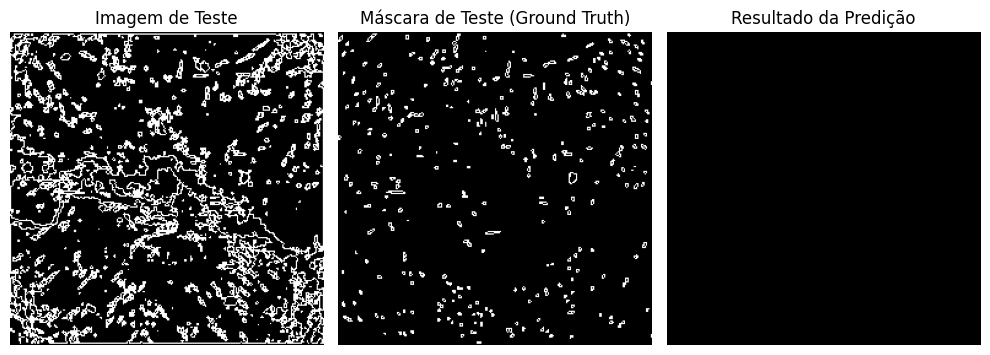

Model: best_model_Adam_loadedresnet_aug_True_200epochs_BN_True_GN_True_2024-07-23 16-07-23.keras
Dice Coefficient: 1.443055570871099e-11
IoU: 0.0


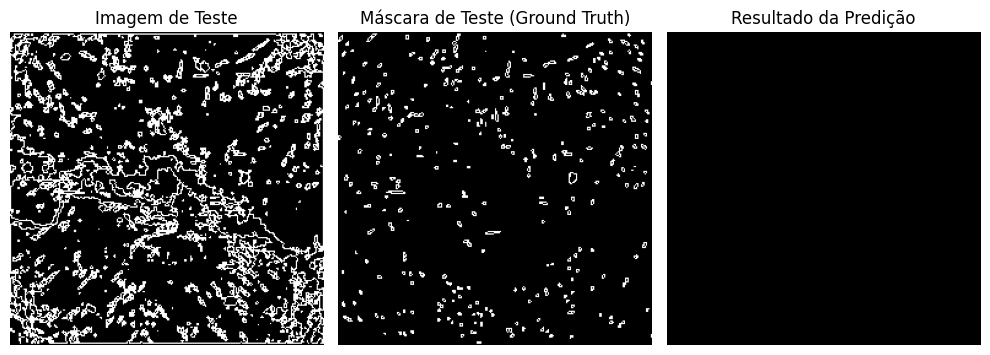

In [33]:
results = predictResults(mask_patches, image_patches, mask, image)
printResults(results) 